In [522]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime 
from sklearn import metrics
import folium

In [523]:
#Change the long unique values into 1 and 2
def change_to12(big_table,severity,col2,col3,new_col):
    lo=C_C[[severity,col2,col3]]
    T=lo.groupby([severity,col2]).count()
    TEST=pd.pivot_table(lo,index=lo[col2],columns=[severity],values=col3,aggfunc='count')
    TEST[[1,2]]=TEST[[1,2]].replace(to_replace=float('NaN'),value=50000)
    TEST[new_col]=TEST[1]/TEST[2]
    TEST[new_col][TEST[new_col]>=1]=int(1)
    TEST[new_col][TEST[new_col]<1]=int(0)
    TEST.drop(columns=[1,2],inplace=True)
    return TEST
#KNN, decision tree, logic regression and SVM
def JAF(test,hat):
    F1=metrics.f1_score(test,hat)
    ACC=metrics.accuracy_score(test,hat)
    JACC=metrics.jaccard_score(test,hat)
    loss=metrics.log_loss(test,hat)
    return [JACC,ACC,F1,loss]

In [524]:
collision=pd.read_csv('/Users/livi/Documents/Data Science Skills/Final Capstone project/Data-Collisions.csv')
print(collision[['ST_COLDESC','SDOT_COLDESC','SEVERITYDESC']].head())
print(collision.shape)
collision.drop(columns=['OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO','EXCEPTRSNCODE', 'EXCEPTRSNDESC','STATUS','SEVERITYCODE.1'],inplace=True)
collision.drop(columns=['ST_COLDESC','SDOT_COLDESC','SEVERITYDESC'],inplace=True)
collision.drop(columns=['PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT','HITPARKEDCAR'],inplace=True)
collision.drop(columns=['PEDROWNOTGRNT', 'SPEEDING', 'INATTENTIONIND'],inplace=True)
collision.drop(columns=['SDOTCOLNUM'],inplace=True)
print(collision.columns)
for col in collision:
    print(col,': ',len(collision[col].unique()))
collision.columns

ST_COLDESC  \
0                                  Entering at angle   
1  From same direction - both going straight - bo...   
2                             One parked--one moving   
3                   From same direction - all others   
4                                  Entering at angle   

                                        SDOT_COLDESC  \
0  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   
1  MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...   
2       MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END   
3  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   
4  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   

                     SEVERITYDESC  
0                Injury Collision  
1  Property Damage Only Collision  
2  Property Damage Only Collision  
3  Property Damage Only Collision  
4                Injury Collision  
(194673, 38)
Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLC

Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'ST_COLCODE',
       'SEGLANEKEY', 'CROSSWALKKEY'],
      dtype='object')

In [525]:
C_C=collision

In [526]:
for col in ['LIGHTCOND','ROADCOND', 'WEATHER']:
    C_C[col].replace(to_replace=['Unknown'],value=[float('NaN')],inplace=True)
for col in ['ST_COLCODE','UNDERINFL']:
    C_C[col].replace(to_replace=['N','Y','0','1'],value=[int(0),int(1),int(0),int(1)],inplace=True)

C_C['INCDATE']=pd.to_datetime(C_C['INCDATE'])
C_C['MONTH']=C_C['INCDATE'].dt.month
C_C['DAY']=C_C['INCDATE'].dt.day
C_C['DOW']=C_C['INCDATE'].dt.dayofweek

C_C['HOUR']=C_C['INCDTTM'].str.extract('(\d{1,2}:\d\d:\d\d ..)')
C_C['HOUR']=C_C['HOUR'].str.pad(width=11,side='left',fillchar='0')
C_C['HOUR']=pd.to_datetime(C_C['HOUR']).dt.hour
C_C.drop(['INCDATE','INCDTTM'],axis=1,inplace=True)

C_C.dropna(inplace=True)
C_C.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53458 entries, 0 to 194671
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEVERITYCODE   53458 non-null  int64  
 1   X              53458 non-null  float64
 2   Y              53458 non-null  float64
 3   ADDRTYPE       53458 non-null  object 
 4   INTKEY         53458 non-null  float64
 5   LOCATION       53458 non-null  object 
 6   COLLISIONTYPE  53458 non-null  object 
 7   JUNCTIONTYPE   53458 non-null  object 
 8   SDOT_COLCODE   53458 non-null  int64  
 9   UNDERINFL      53458 non-null  float64
 10  WEATHER        53458 non-null  object 
 11  ROADCOND       53458 non-null  object 
 12  LIGHTCOND      53458 non-null  object 
 13  ST_COLCODE     53458 non-null  object 
 14  SEGLANEKEY     53458 non-null  int64  
 15  CROSSWALKKEY   53458 non-null  int64  
 16  MONTH          53458 non-null  int64  
 17  DAY            53458 non-null  int64  
 18  DOW  

In [527]:
C_C[C_C['LIGHTCOND']=='Daylight'].sort_values('HOUR').head()

,SEVERITYCODE,X,Y,ADDRTYPE,INTKEY,LOCATION,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,SEGLANEKEY,CROSSWALKKEY,MONTH,DAY,DOW,HOUR
61648,1,-122.330908,47.555643,Intersection,33145.0,3RD AVE S AND S DAWSON ST,Angles,At Intersection (intersection related),11,0.0,Overcast,Dry,Daylight,10,0,0,6,17,1,0.0
53020,1,-122.337544,47.606122,Intersection,29611.0,1ST AVE AND SENECA ST,Other,At Intersection (intersection related),14,0.0,Clear,Dry,Daylight,23,0,0,10,10,2,0.0
44166,2,-122.321439,47.547503,Intersection,33135.0,CORSON AVE S AND S MICHIGAN ST,Other,At Intersection (intersection related),26,0.0,Clear,Dry,Daylight,50,0,0,7,22,5,0.0
185303,2,-122.324749,47.605555,Intersection,29959.0,9TH AVE AND JAMES ST,Sideswipe,At Intersection (intersection related),11,1.0,Clear,Dry,Daylight,11,0,0,7,11,2,0.0
146635,1,-122.312772,47.614499,Intersection,30136.0,15TH AVE AND E MADISON ST,Left Turn,At Intersection (intersection related),11,0.0,Overcast,Dry,Daylight,28,0,0,11,16,0,0.0


In [528]:
Count_Sev=C_C.groupby('SEVERITYCODE').count()[['LOCATION']]
Count_Sev_rm_leng=int(Count_Sev.iloc[0]-Count_Sev.iloc[1])
Count_Sev_rm_leng

import random
SEV1=C_C[C_C['SEVERITYCODE']==1]
C_C.drop(index=random.sample(SEV1.index.tolist(), Count_Sev_rm_leng),inplace=True)
C_C.reset_index(drop=True)
Count_Sev=C_C.groupby('SEVERITYCODE').count()[['LOCATION']]

In [529]:
C_C.info()
for col in C_C:
    print(col,':',len(C_C[col].unique()))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47104 entries, 0 to 194671
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEVERITYCODE   47104 non-null  int64  
 1   X              47104 non-null  float64
 2   Y              47104 non-null  float64
 3   ADDRTYPE       47104 non-null  object 
 4   INTKEY         47104 non-null  float64
 5   LOCATION       47104 non-null  object 
 6   COLLISIONTYPE  47104 non-null  object 
 7   JUNCTIONTYPE   47104 non-null  object 
 8   SDOT_COLCODE   47104 non-null  int64  
 9   UNDERINFL      47104 non-null  float64
 10  WEATHER        47104 non-null  object 
 11  ROADCOND       47104 non-null  object 
 12  LIGHTCOND      47104 non-null  object 
 13  ST_COLCODE     47104 non-null  object 
 14  SEGLANEKEY     47104 non-null  int64  
 15  CROSSWALKKEY   47104 non-null  int64  
 16  MONTH          47104 non-null  int64  
 17  DAY            47104 non-null  int64  
 18  DOW  

SEVERITYCODE      1      2
ADDRTYPE                  
Intersection  23552  23552


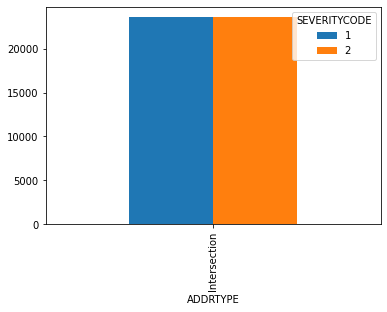

SEVERITYCODE       1      2
COLLISIONTYPE              
Angles         11187  10276
Cycles           230   2415
Head On          198    136
Left Turn       4562   3986
Other           1824    824


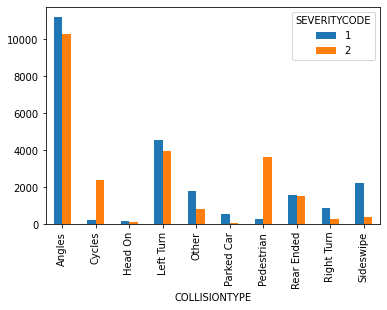

SEVERITYCODE     1     2
MONTH                   
1             2082  1992
2             1806  1569
3             2063  2000
4             1894  1891
5             2014  2090


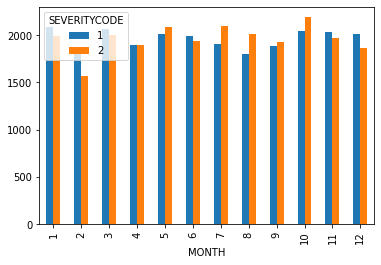

SEVERITYCODE    1    2
DAY                   
1             522  505
2             499  542
3             539  487
4             495  487
5             529  513


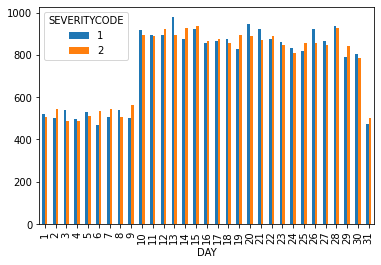

SEVERITYCODE     1     2
DOW                     
0             3115  3342
1             3490  3513
2             3509  3629
3             3519  3583
4             4030  3847


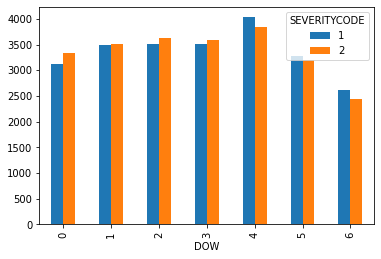

SEVERITYCODE    1    2
HOUR                  
0.0           436  364
1.0           411  331
2.0           405  325
3.0           169  117
4.0           129  100


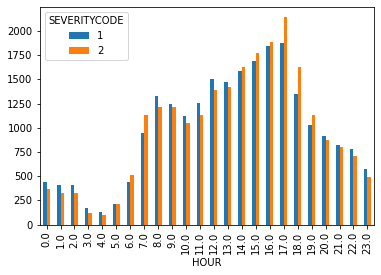

SEVERITYCODE                                             1        2
JUNCTIONTYPE                                                       
At Intersection (but not related to intersection)    865.0    544.0
At Intersection (intersection related)             22671.0  23000.0
Mid-Block (not related to intersection)                NaN      1.0
Ramp Junction                                         15.0      7.0
Unknown                                                1.0      NaN


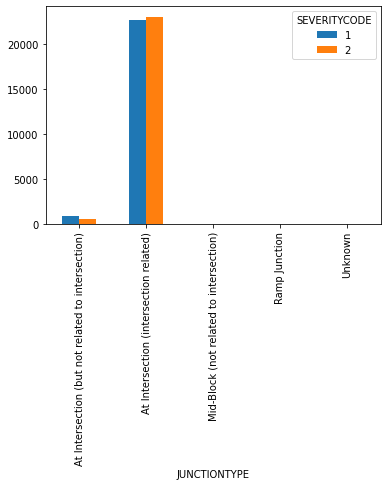

SEVERITYCODE        1        2
SDOT_COLCODE                  
0               150.0    135.0
11            18115.0  14715.0
12                5.0      3.0
13               21.0      1.0
14             2919.0   2182.0


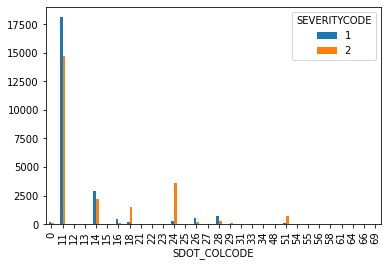

SEVERITYCODE      1      2
UNDERINFL                 
0.0           22804  22562
1.0             748    990


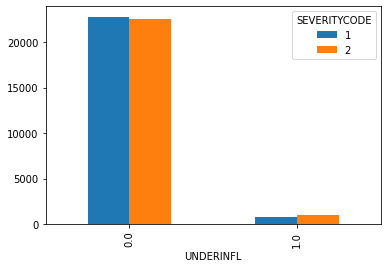

SEVERITYCODE           1      2
WEATHER                        
Blowing Sand/Dirt      2      6
Clear              14831  15064
Fog/Smog/Smoke        64     77
Other                 32     22
Overcast            3741   3556


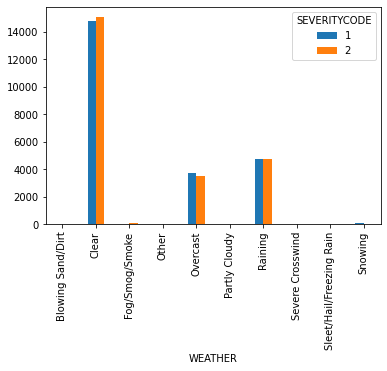

SEVERITYCODE       1      2
ROADCOND                   
Dry            16564  16789
Ice               92     59
Oil                3      4
Other              6      9
Sand/Mud/Dirt      4      4


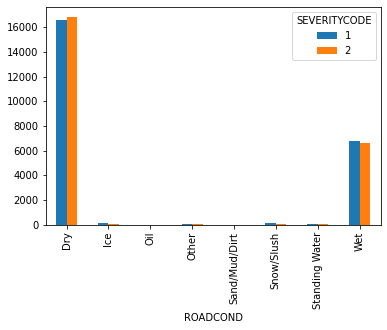

SEVERITYCODE                 1     2
LIGHTCOND                           
Dark - No Street Lights    129   104
Dark - Street Lights Off   126   140
Dark - Street Lights On   6278  5993
Dark - Unknown Lighting      1     3
Dawn                       312   371


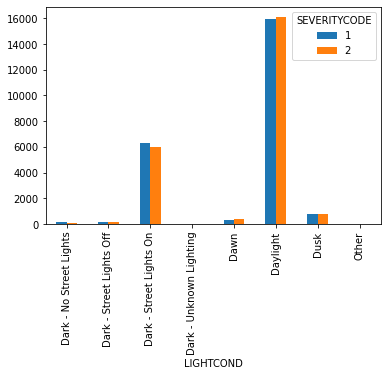

SEVERITYCODE      1       2
ST_COLCODE                 
0             114.0  1139.0
1              78.0   782.0
2              26.0   414.0
3               2.0    18.0
4               NaN     5.0


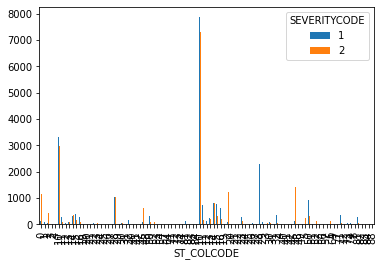

In [530]:
for i in C_C[['ADDRTYPE','COLLISIONTYPE', 'MONTH', 'DAY','DOW','HOUR', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND','ST_COLCODE']]:
       df=pd.concat([C_C[['SEVERITYCODE','SEGLANEKEY']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='SEGLANEKEY',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       TEST.plot(kind='bar')
       plt.show()

In [531]:
C_C.columns

Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'UNDERINFL', 'WEATHER',
       'ROADCOND', 'LIGHTCOND', 'ST_COLCODE', 'SEGLANEKEY', 'CROSSWALKKEY',
       'MONTH', 'DAY', 'DOW', 'HOUR'],
      dtype='object')

In [532]:
# scatter plot of the location that accidient will happen
temp=C_C[['SEVERITYCODE', 'X', 'Y','LOCATION','DOW']]
coun=pd.DataFrame(temp.groupby(['SEVERITYCODE', 'X', 'Y','LOCATION']).count()['DOW'])
coun=coun.reset_index()
coun1=coun[coun['SEVERITYCODE']==1].sort_values('DOW',ascending=False).reset_index(drop=True)
coun2=coun[coun['SEVERITYCODE']==2].sort_values('DOW',ascending=False).reset_index(drop=True)
coun1.head()
coun2.head()
#coun.sort_values('DOW',ascending=False,inplace=True)
#coun1.head(100).sort_values('LOCATION').head(50)

,SEVERITYCODE,X,Y,LOCATION,DOW
0,2,-122.328079,47.604161,6TH AVE AND JAMES ST,95
1,2,-122.332451,47.607266,5TH AVE AND SPRING ST,61
2,2,-122.328913,47.613466,BOREN AVE AND PIKE ST,59
3,2,-122.316733,47.612889,12TH AVE AND E MADISON ST,57
4,2,-122.277664,47.551176,RAINIER AVE S AND S ORCAS ST,53


In [533]:
coun.head()

,SEVERITYCODE,X,Y,LOCATION,DOW
0,1,-122.418139,47.574598,BEACH DR SW AND BENTON PL SW,1
1,1,-122.414187,47.650474,MAGNOLIA BLVD W AND W BERTONA ST,2
2,1,-122.413350,47.575943,63RD AVE SW AND SW ADMIRAL WAY,2
3,1,-122.413331,47.572612,63RD AVE SW AND BEACH DR SW,1
4,1,-122.413281,47.578356,63RD AVE SW AND ALKI AVE SW,1


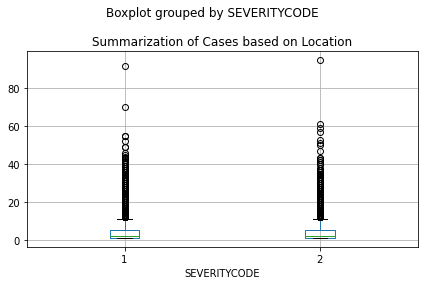

In [534]:

coun.boxplot(by='SEVERITYCODE',column='DOW')
plt.title('Summarization of Cases based on Location')
plt.tight_layout()
plt.savefig('Summary of cases based on location')
plt.show()

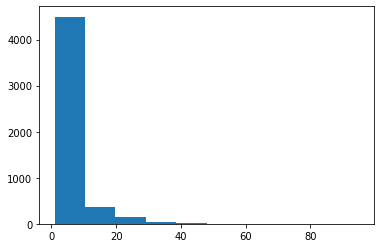

In [535]:
plt.hist(coun2['DOW'])
plt.show()

In [536]:
print(coun1.describe())
print(coun2.describe())
print(1.5*(coun1['DOW'].quantile(0.75)-coun1['DOW'].quantile(0.25))+coun1['DOW'].quantile(0.75))
print(1.5*(coun2['DOW'].quantile(0.75)-coun2['DOW'].quantile(0.25))+coun2['DOW'].quantile(0.75))

SEVERITYCODE            X            Y          DOW
count        5557.0  5557.000000  5557.000000  5557.000000
mean            1.0  -122.331526    47.622141     4.238258
std             0.0     0.033631     0.059737     6.002467
min             1.0  -122.418139    47.495573     1.000000
25%             1.0  -122.356597    47.571480     1.000000
50%             1.0  -122.329055    47.622051     2.000000
75%             1.0  -122.306365    47.672149     5.000000
max             1.0  -122.241082    47.734136    92.000000
       SEVERITYCODE            X            Y          DOW
count        5053.0  5053.000000  5053.000000  5053.000000
mean            2.0  -122.332654    47.624486     4.660993
std             0.0     0.033331     0.058960     6.224716
min             2.0  -122.414782    47.495989     1.000000
25%             2.0  -122.356739    47.575254     1.000000
50%             2.0  -122.330929    47.624289     2.000000
75%             2.0  -122.308845    47.673709     5.000000
max 

In [537]:
m=folium.Map(location=[47.618233, -122.286167],zoom_start=11,tiles='OpenStreetMap')

for i in range(100):
    folium.CircleMarker(location=[coun1['Y'][i], coun1['X'][i]], radius=int(coun1['DOW'][i])/5,fill_color='#3186cc',popup=str(coun1['DOW'][i]),fill=True,color='#3186cc').add_to(m)
    
    folium.CircleMarker(location=[coun2['Y'][i], coun2['X'][i]], radius=int(coun2['DOW'][i])/5,fill_color='#DC143C',popup=str(coun2['DOW'][i]),fill=True,color='#DC143C').add_to(m)

m

In [538]:
X_X=change_to12(C_C,'SEVERITYCODE','X','DOW','X_index')
Y_Y=change_to12(C_C,'SEVERITYCODE','Y','DOW','Y_index')
Loca=change_to12(C_C,'SEVERITYCODE','LOCATION','DOW','LOC_index')
INTK=change_to12(C_C,'SEVERITYCODE','INTKEY','DOW','INTK_index')
Seg=change_to12(C_C,'SEVERITYCODE','SEGLANEKEY','DOW','SEG_index')
Cross=change_to12(C_C,'SEVERITYCODE','CROSSWALKKEY','DOW','CROSS_index')

C_C=pd.merge(C_C,X_X,on='X', how='left')
C_C=pd.merge(C_C,Y_Y,on='Y', how='left')
C_C=pd.merge(C_C,Loca,on='LOCATION', how='left')
C_C=pd.merge(C_C,INTK,on='INTKEY', how='left')
C_C=pd.merge(C_C,Seg,on='SEGLANEKEY', how='left')
C_C=pd.merge(C_C,Cross,on='CROSSWALKKEY', how='left')

C_C.drop(columns=['X','Y','LOCATION','INTKEY','SEGLANEKEY','CROSSWALKKEY'],inplace=True)
C_C.head()

,SEVERITYCODE,ADDRTYPE,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,MONTH,DAY,DOW,HOUR,X_index,Y_index,LOC_index,INTK_index,SEG_index,CROSS_index
0,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Overcast,Wet,Daylight,10,3,27,2,14.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Raining,Wet,Daylight,10,1,28,2,8.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1,Intersection,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,4,20,5,17.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2,Intersection,Cycles,At Intersection (intersection related),51,0.0,Clear,Dry,Daylight,5,4,15,2,17.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,3,20,0,15.0,1.0,1.0,1.0,1.0,1.0,1.0


In [539]:
C_C.shape
for col in C_C:
    print(C_C[col].unique())

[2 1]
['Intersection']
['Angles' 'Cycles' 'Rear Ended' 'Left Turn' 'Other' 'Pedestrian'
 'Sideswipe' 'Head On' 'Parked Car' 'Right Turn']
['At Intersection (intersection related)'
 'At Intersection (but not related to intersection)' 'Ramp Junction'
 'Mid-Block (not related to intersection)' 'Unknown']
[11 51 14 28 24 18 26 16 29  0 25 27 31 64 13 21 15 48 23 58 12 33 34 22
 69 55 54 61 66 56]
[0. 1.]
['Overcast' 'Raining' 'Clear' 'Snowing' 'Fog/Smog/Smoke'
 'Sleet/Hail/Freezing Rain' 'Other' 'Blowing Sand/Dirt' 'Severe Crosswind'
 'Partly Cloudy']
['Wet' 'Dry' 'Snow/Slush' 'Ice' 'Other' 'Oil' 'Standing Water'
 'Sand/Mud/Dirt']
['Daylight' 'Dark - Street Lights On' 'Dusk' 'Dawn'
 'Dark - Street Lights Off' 'Dark - No Street Lights' 'Other'
 'Dark - Unknown Lighting']
['10' '5' '14' '28' '13' '50' 0 '45' 1 '11' '30' '32' '15' '19' '2' '16'
 '81' '12' '3' '52' '24' '40' '71' '6' '83' '23' '74' '26' '27' '29' '20'
 '21' '73' '22' '25' '49' '84' '82' '51' '4' '72' '53' 10 28 50 20 16 11
 14

In [540]:
C_C.shape

(47104, 20)

In [541]:
C_C.columns
C_C.drop(columns=['ADDRTYPE'],inplace=True)
for col in C_C:
    print(col,':',len(C_C[col].unique()))

SEVERITYCODE : 2
COLLISIONTYPE : 10
JUNCTIONTYPE : 5
SDOT_COLCODE : 30
UNDERINFL : 2
WEATHER : 10
ROADCOND : 8
LIGHTCOND : 8
ST_COLCODE : 95
MONTH : 12
DAY : 31
DOW : 7
HOUR : 24
X_index : 2
Y_index : 2
LOC_index : 2
INTK_index : 2
SEG_index : 2
CROSS_index : 2


SEVERITYCODE     1     2
MONTH                   
1             2082  1992
2             1806  1569
3             2063  2000
4             1894  1891
5             2014  2090


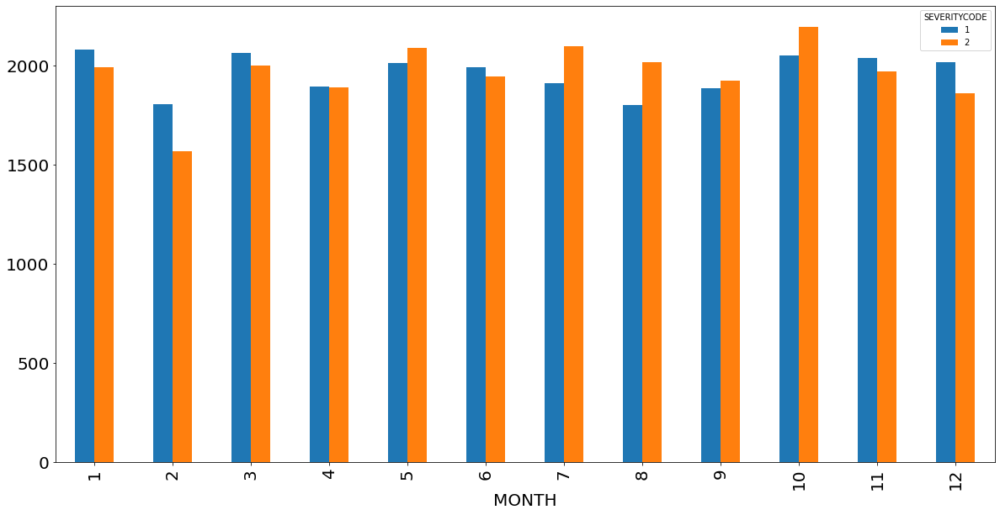

SEVERITYCODE     1     2
DOW                     
0             3115  3342
1             3490  3513
2             3509  3629
3             3519  3583
4             4030  3847


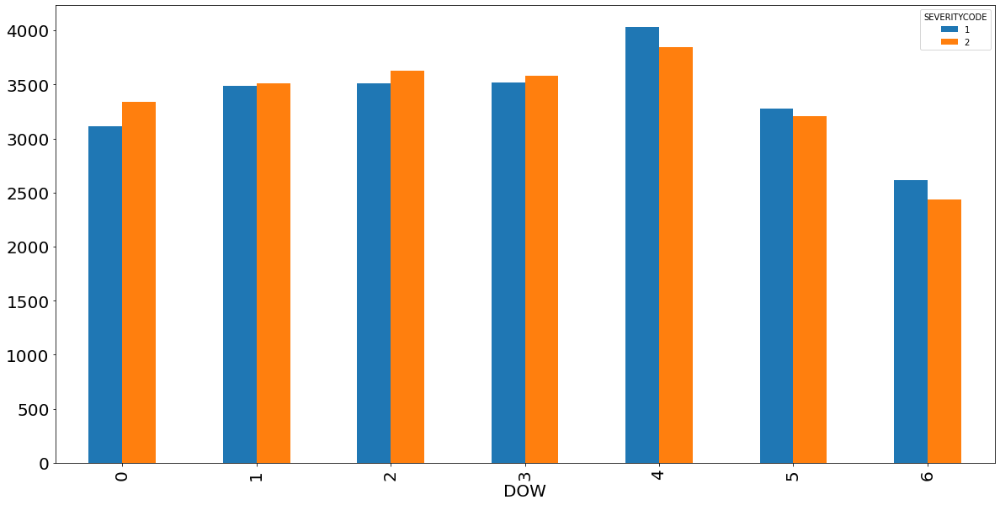

SEVERITYCODE    1    2
HOUR                  
0.0           436  364
1.0           411  331
2.0           405  325
3.0           169  117
4.0           129  100


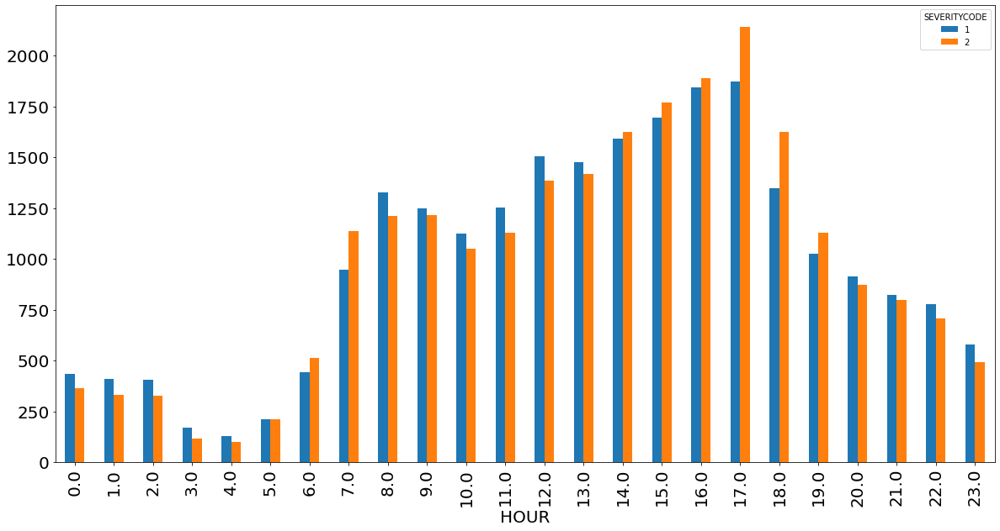

SEVERITYCODE    1    2
DAY                   
1             522  505
2             499  542
3             539  487
4             495  487
5             529  513


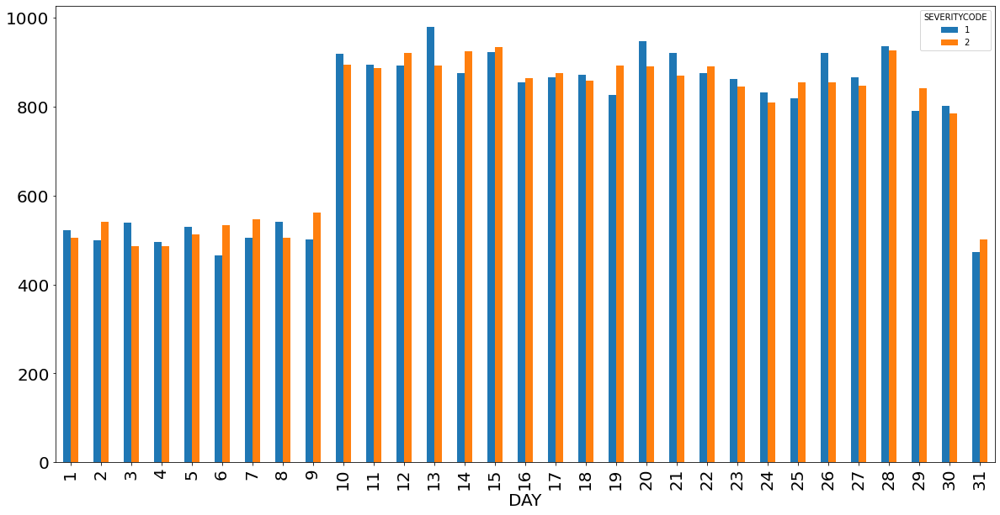

In [542]:
for i in C_C[['MONTH', 'DOW', 'HOUR','DAY']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=False)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=20)
       plt.savefig(i)
       plt.show()


SEVERITYCODE      1      2
UNDERINFL                 
0.0           22804  22562
1.0             748    990


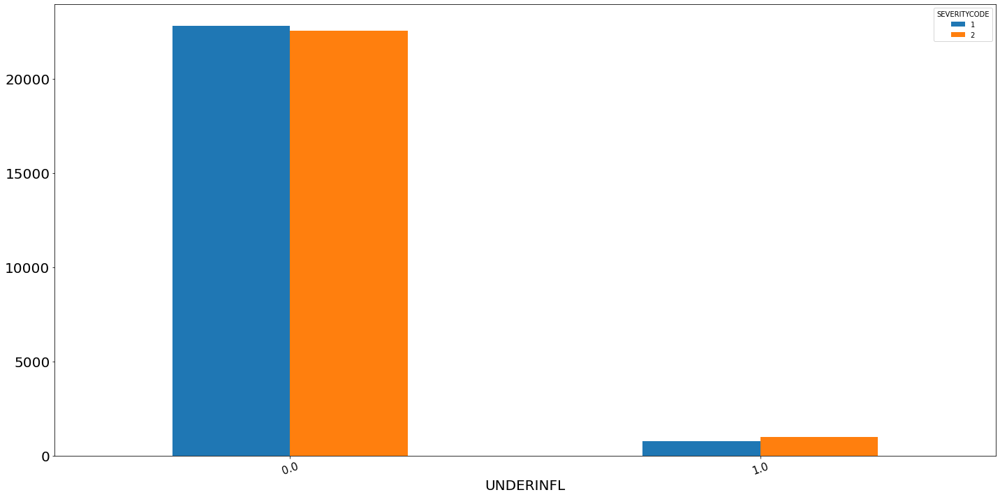

SEVERITYCODE           1      2
WEATHER                        
Blowing Sand/Dirt      2      6
Clear              14831  15064
Fog/Smog/Smoke        64     77
Other                 32     22
Overcast            3741   3556


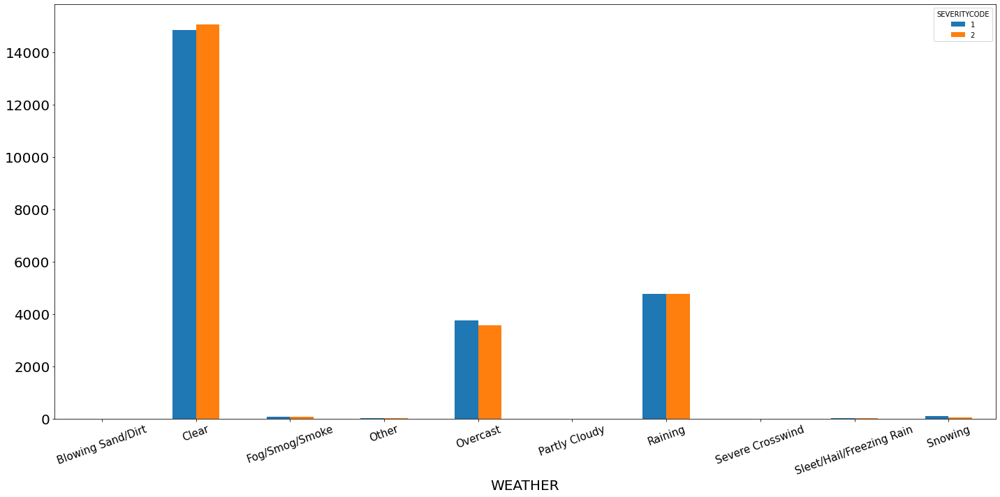

SEVERITYCODE       1      2
ROADCOND                   
Dry            16564  16789
Ice               92     59
Oil                3      4
Other              6      9
Sand/Mud/Dirt      4      4


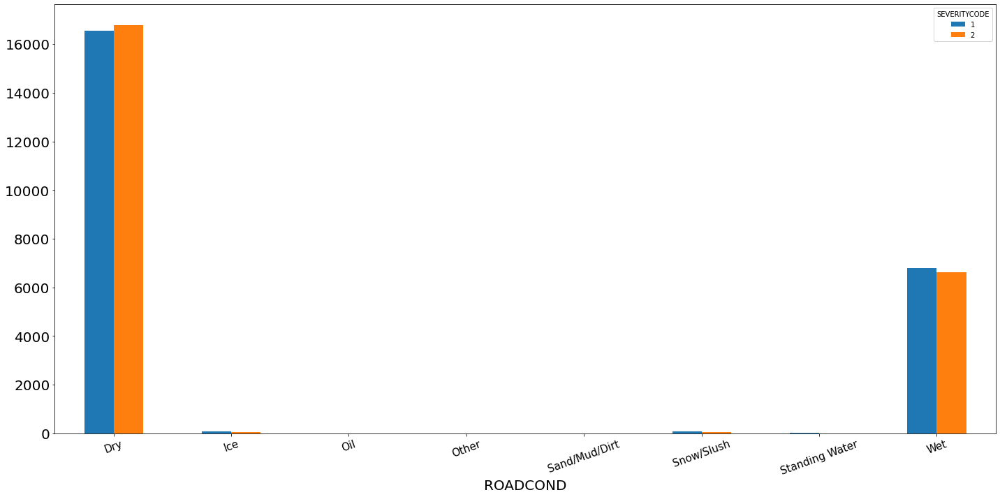

SEVERITYCODE                 1     2
LIGHTCOND                           
Dark - No Street Lights    129   104
Dark - Street Lights Off   126   140
Dark - Street Lights On   6278  5993
Dark - Unknown Lighting      1     3
Dawn                       312   371


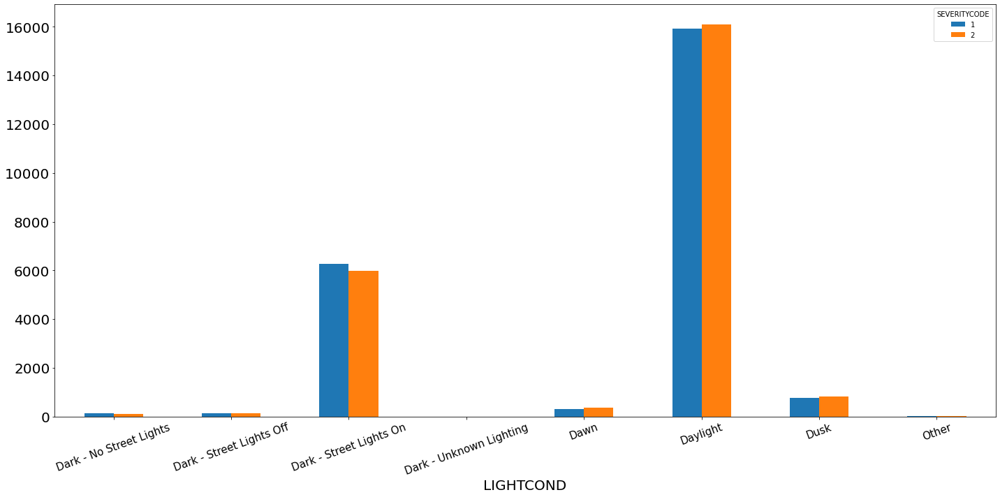

In [543]:
for i in C_C[['UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=False)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=15, rotation=20)
       plt.tight_layout()
       plt.savefig(i,size=(20,10))
       plt.show()

SEVERITYCODE       1      2
COLLISIONTYPE              
Angles         11187  10276
Cycles           230   2415
Head On          198    136
Left Turn       4562   3986
Other           1824    824


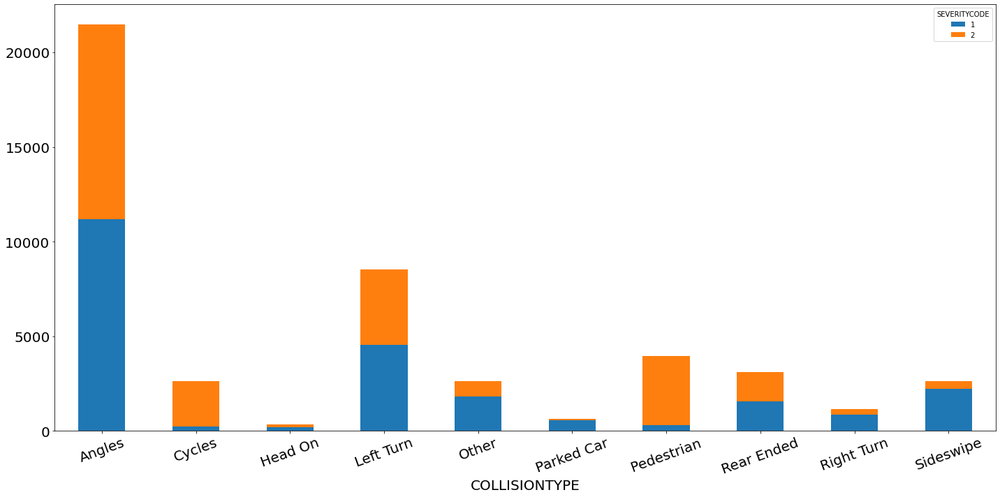

SEVERITYCODE                                             1        2
JUNCTIONTYPE                                                       
At Intersection (but not related to intersection)    865.0    544.0
At Intersection (intersection related)             22671.0  23000.0
Mid-Block (not related to intersection)                NaN      1.0
Ramp Junction                                         15.0      7.0
Unknown                                                1.0      NaN


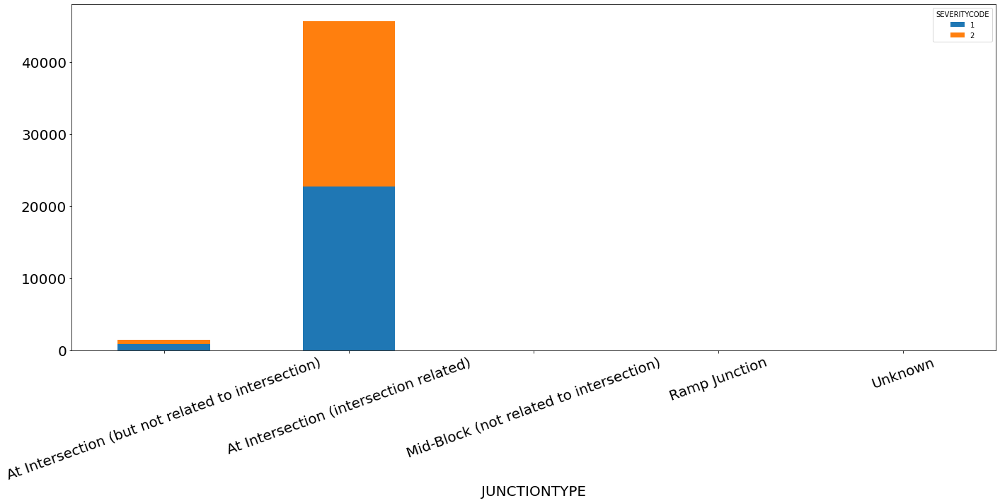

In [544]:
for i in C_C[['COLLISIONTYPE', 'JUNCTIONTYPE']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=True)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=20, rotation=20)
       plt.tight_layout()
       plt.savefig(i)
       plt.show()

In [545]:
ML_D=C_C
for col in ML_D:
    print(col,len(ML_D[col].unique()))
ML_D.head()

SEVERITYCODE 2
COLLISIONTYPE 10
JUNCTIONTYPE 5
SDOT_COLCODE 30
UNDERINFL 2
WEATHER 10
ROADCOND 8
LIGHTCOND 8
ST_COLCODE 95
MONTH 12
DAY 31
DOW 7
HOUR 24
X_index 2
Y_index 2
LOC_index 2
INTK_index 2
SEG_index 2
CROSS_index 2


,SEVERITYCODE,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,MONTH,DAY,DOW,HOUR,X_index,Y_index,LOC_index,INTK_index,SEG_index,CROSS_index
0,2,Angles,At Intersection (intersection related),11,0.0,Overcast,Wet,Daylight,10,3,27,2,14.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2,Angles,At Intersection (intersection related),11,0.0,Raining,Wet,Daylight,10,1,28,2,8.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,4,20,5,17.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2,Cycles,At Intersection (intersection related),51,0.0,Clear,Dry,Daylight,5,4,15,2,17.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,3,20,0,15.0,1.0,1.0,1.0,1.0,1.0,1.0


In [546]:
C_C.head().to_csv('Clean.csv')



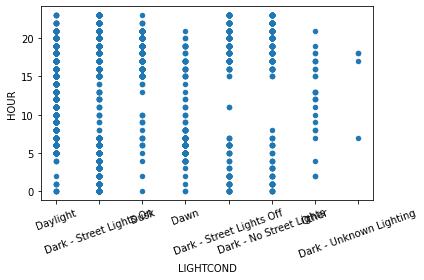

In [547]:
C_C.plot(kind='scatter',x='LIGHTCOND',y='HOUR')
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

In [548]:
#Preprocessing of train test_model
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
for col in ['COLLISIONTYPE','JUNCTIONTYPE','WEATHER', 'ROADCOND', 'LIGHTCOND']:
    tran=preprocessing.LabelEncoder()
    ML_D[col]=tran.fit_transform(ML_D[col])
#Normalize the data
ML_D.drop(columns=['X_index','Y_index','SDOT_COLCODE'],inplace=True)
for col in ML_D.columns[1:]:
    ML_D[col]=preprocessing.StandardScaler().fit(ML_D[[col]].values).transform(ML_D[[col]])
print(ML_D.head())
xtrain,xtest,ytrain,ytest=train_test_split(ML_D.iloc[:,1:],ML_D.iloc[:,0],test_size=0.2,random_state=4)
print(xtrain.shape,xtest.shape)
print(ytrain.shape,ytest.shape)

SEVERITYCODE  COLLISIONTYPE  JUNCTIONTYPE  UNDERINFL   WEATHER  ROADCOND  \
0             2      -0.871660      0.163687  -0.195731  0.708440  1.577434   
1             2      -0.871660      0.163687  -0.195731  1.660398  1.577434   
2             1      -0.871660      0.163687  -0.195731 -0.719495 -0.637717   
3             2      -0.532355      0.163687  -0.195731 -0.719495 -0.637717   
4             2      -0.871660      0.163687  -0.195731 -0.719495 -0.637717   

   LIGHTCOND  ST_COLCODE     MONTH       DAY       DOW      HOUR  LOC_index  \
0   0.578409   -0.524873 -1.028811  1.188835 -0.472844  0.095661   0.984161   
1   0.578409   -0.524873 -1.609347  1.309631 -0.472844 -1.031406   0.984161   
2   0.578409   -0.524873 -0.738543  0.343262  1.096920  0.659194   0.984161   
3   0.578409   -0.843172 -0.738543 -0.260718 -0.472844  0.659194   0.984161   
4   0.578409   -0.524873 -1.028811  0.343262 -1.519354  0.283505   0.984161   

   INTK_index  SEG_index  CROSS_index  
0    0.984203

In [506]:
from sklearn.neighbors import KNeighborsClassifier
all_score=[]
for k in range(1,30,2):
    KNN_yhat=KNeighborsClassifier(n_neighbors=k).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,KNN_yhat))
KNNscore=pd.DataFrame(all_score)
KNNscore.head()

,0,1,2,3
0,0.973142,0.986413,0.986388,17.229
1,0.657697,0.791046,0.793507,17.229
2,0.591749,0.739219,0.743521,17.229
3,0.564084,0.715150,0.721296,17.229
4,0.545254,0.699334,0.705714,17.229


JACC       ACC        F1  LogLoss
k                                       
1  0.973142  0.986413  0.986388   17.229
3  0.657697  0.791046  0.793507   17.229
5  0.591749  0.739219  0.743521   17.229
7  0.564084  0.715150  0.721296   17.229
9  0.545254  0.699334  0.705714   17.229
The max JACC is at 0.9731416880868698 with k=1
The max ACC is at 0.9864129713663986 with k=1
The max F1 is at 0.9863880470037751 with k=1


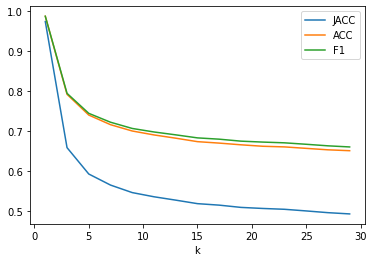

The min Logloss is at 17.229000077701656 with k=1


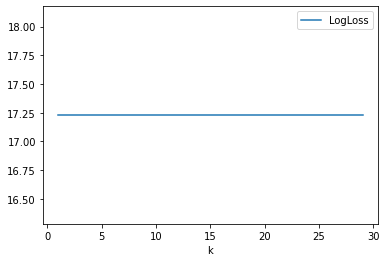

In [507]:
score=KNNscore
score['k']=list(range(1,30,2))
score.set_index('k',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(2*score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(2*score['LogLoss'].argmin()+1))
plt.show()

In [508]:
from sklearn.tree import DecisionTreeClassifier
all_score=[]
for d in range(1,10):
    DT_yhat=DecisionTreeClassifier(criterion='entropy',max_depth=d).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,DT_yhat))

DT_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
d                                       
1  0.537117  0.576387  0.698862   17.229
2  0.537117  0.576387  0.698862   17.229
3  0.533278  0.600085  0.695605   17.229
4  0.559648  0.616113  0.717659   17.229
5  0.468453  0.637821  0.638022   17.229
The max JACC is at 0.5596481081245624 with k=4
The max ACC is at 0.6543799591327655 with k=9
The max F1 is at 0.7176594581934578 with k=4


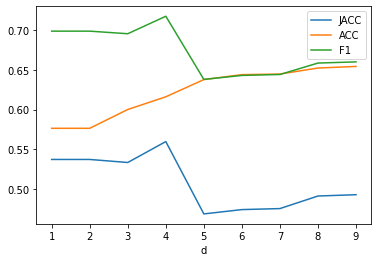

The min Logloss is at 17.229000077701656 with k=1


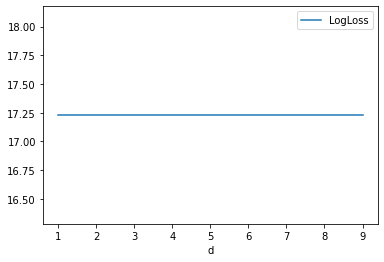

In [509]:
score=DT_score
score['d']=list(range(1,10))
score.set_index('d',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()


In [510]:
from sklearn import svm
ker=['linear','rbf','sigmoid']
all_score=[]
for i in ker:
    svc_yhat=svm.SVC(kernel=i).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,svc_yhat))
svc_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
method                                        
linear   0.390254  0.556723  0.561414   17.229
rbf      0.486248  0.638643  0.654329   17.229
sigmoid  0.326597  0.493326  0.492383   17.229
The max JACC is at 0.4862478777589134 with k=2
The max ACC is at 0.6386434201098639 with k=2
The max F1 is at 0.6543294493945624 with k=2


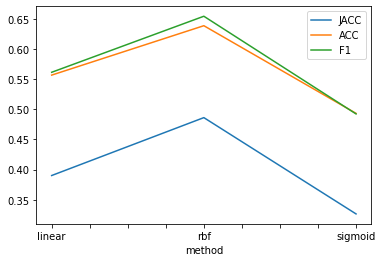

The min Logloss is at 17.229000077701656 with k=1


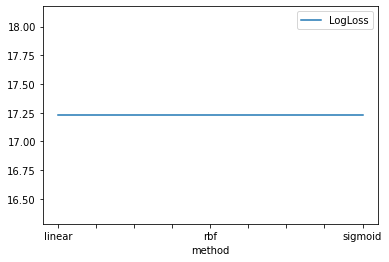

In [511]:
score=svc_score
score['method']=ker
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

In [512]:
from sklearn.linear_model import LogisticRegression
solv=['newton-cg','lbfgs','liblinear','sag','saga']
all_score=[]
for i in solv:
    Log_yhat=LogisticRegression(C=0.01,solver=i).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,Log_yhat))
Log_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
method                                          
newton-cg  0.406700  0.566223  0.578233   17.229
lbfgs      0.406686  0.566197  0.578218   17.229
liblinear  0.406671  0.566170  0.578203   17.229
sag        0.406700  0.566223  0.578233   17.229
saga       0.406686  0.566197  0.578218   17.229
The max JACC is at 0.4067003012594824 with k=1
The max ACC is at 0.5662234960061566 with k=1
The max F1 is at 0.5782330477861493 with k=1


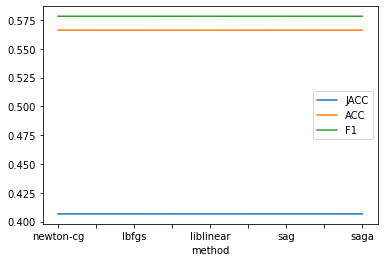

The min Logloss is at 17.229000077701656 with k=1


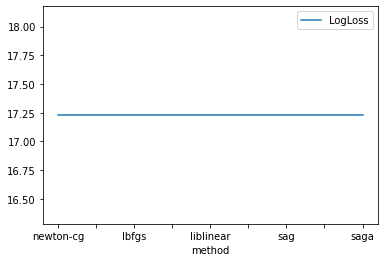

In [513]:
score=Log_score
score['method']=solv
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

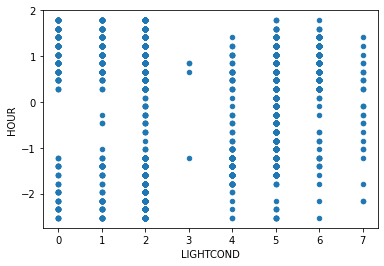

In [514]:
from sklearn.neighbors import KNeighborsClassifier
all_score=[]
for k in range(1,30,2):
    KNN_yhat=KNeighborsClassifier(n_neighbors=k).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,KNN_yhat))
KNNscore=pd.DataFrame(all_score)
KNNscore.head()

,0,1,2,3
0,0.405840,0.576690,0.577363,17.432935
1,0.415092,0.582847,0.586664,17.432935
2,0.429676,0.592825,0.601082,17.432935
3,0.431524,0.594204,0.602888,17.432935
4,0.432428,0.596115,0.603770,17.432935


JACC       ACC        F1    LogLoss
k                                         
1  0.405840  0.576690  0.577363  17.432935
3  0.415092  0.582847  0.586664  17.432935
5  0.429676  0.592825  0.601082  17.432935
7  0.431524  0.594204  0.602888  17.432935
9  0.432428  0.596115  0.603770  17.432935
The max JACC is at 0.44477611940298506 with k=27
The max ACC is at 0.6051374588684852 with k=27
The max F1 is at 0.615702479338843 with k=27


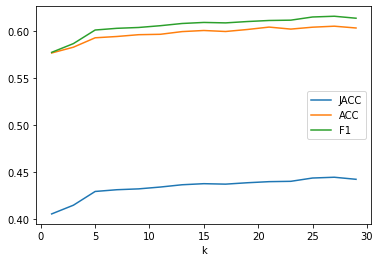

The min Logloss is at 17.432935340577526 with k=1


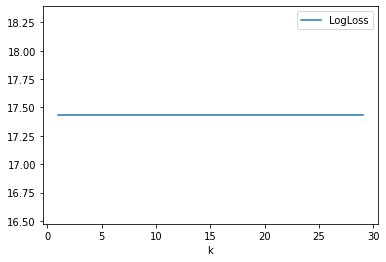

In [515]:
score=KNNscore
score['k']=list(range(1,30,2))
score.set_index('k',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(2*score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(2*score['LogLoss'].argmin()+1))
plt.show()

In [516]:
from sklearn.tree import DecisionTreeClassifier
all_score=[]
for d in range(1,10):
    DT_yhat=DecisionTreeClassifier(criterion='entropy',max_depth=d).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,DT_yhat))

DT_score=pd.DataFrame(all_score)

JACC       ACC        F1    LogLoss
d                                         
1  0.544335  0.583802  0.704944  17.432935
2  0.544335  0.583802  0.704944  17.432935
3  0.537156  0.603333  0.698896  17.432935
4  0.564640  0.620741  0.721751  17.432935
5  0.476810  0.645579  0.645729  17.432935
The max JACC is at 0.5646399415133423 with k=4
The max ACC is at 0.6522662137777306 with k=8
The max F1 is at 0.7217506424733275 with k=4


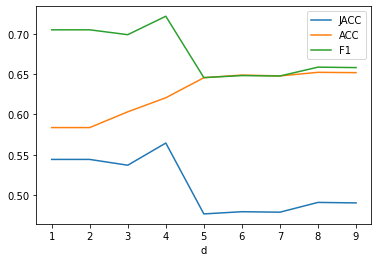

The min Logloss is at 17.432935340577526 with k=1


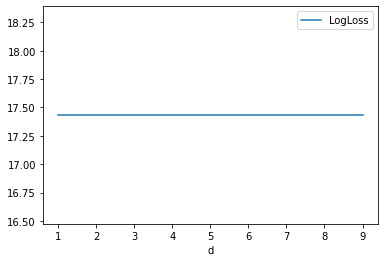

In [517]:
score=DT_score
score['d']=list(range(1,10))
score.set_index('d',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()


In [518]:
from sklearn import svm
ker=['linear','rbf','sigmoid']
all_score=[]
for i in ker:
    svc_yhat=svm.SVC(kernel=i).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,svc_yhat))
svc_score=pd.DataFrame(all_score)

JACC       ACC        F1    LogLoss
method                                          
linear   0.396201  0.564696  0.567542  17.432935
rbf      0.488246  0.639529  0.656136  17.432935
sigmoid  0.327686  0.494533  0.493620  17.432935
The max JACC is at 0.488245931283906 with k=2
The max ACC is at 0.6395287124509076 with k=2
The max F1 is at 0.6561360874848116 with k=2


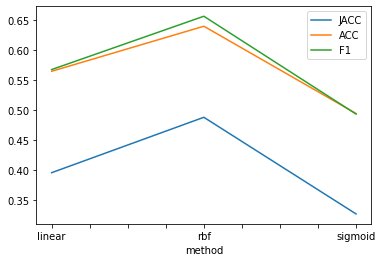

The min Logloss is at 17.432935340577526 with k=1


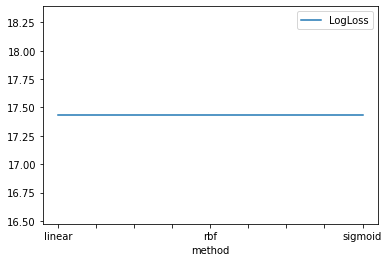

In [519]:
score=svc_score
score['method']=ker
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

In [520]:
from sklearn.linear_model import LogisticRegression
solv=['newton-cg','lbfgs','liblinear','sag','saga']
all_score=[]
for i in solv:
    Log_yhat=LogisticRegression(C=0.01,solver=i).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,Log_yhat))
Log_score=pd.DataFrame(all_score)

JACC       ACC        F1    LogLoss
method                                           
newton-cg  0.41298  0.574674  0.584552  17.432935
lbfgs      0.41298  0.574674  0.584552  17.432935
liblinear  0.41298  0.574674  0.584552  17.432935
sag        0.41298  0.574674  0.584552  17.432935
saga       0.41298  0.574674  0.584552  17.432935
The max JACC is at 0.4129797831819514 with k=1
The max ACC is at 0.5746736015285001 with k=1
The max F1 is at 0.5845515811301193 with k=1


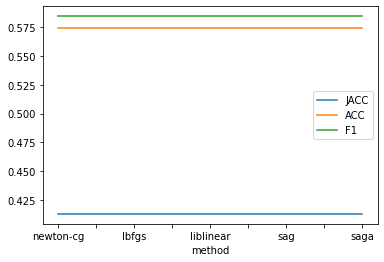

The min Logloss is at 17.432935340577526 with k=1


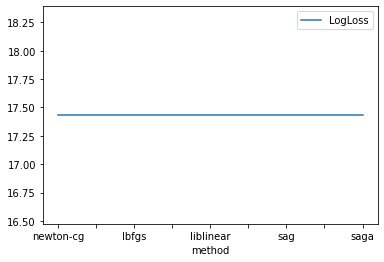

In [521]:
score=Log_score
score['method']=solv
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

In [550]:
d4tree=DecisionTreeClassifier(criterion='entropy',max_depth=4).fit(xtrain,ytrain)

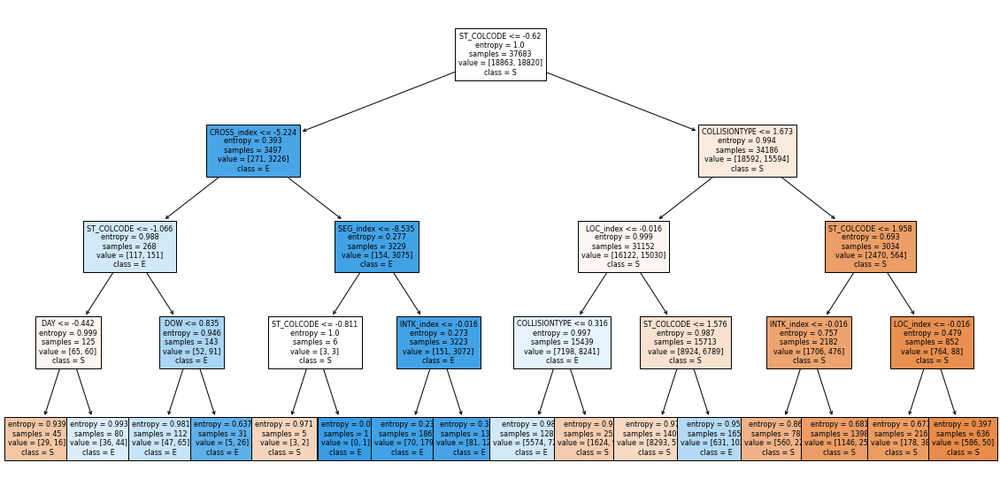

In [609]:
%matplotlib inline
from sklearn import tree
ML_D.columns[1:]
plt.figure(figsize=(20,10))
tree.plot_tree(d4tree,filled=True,feature_names=ML_D.columns[1:].to_list(),class_names=ML_D.columns[0],fontsize=8,rotate=True)
plt.savefig('tree.png')



In [599]:
text_representation = tree.export_text(d4tree,feature_names=ML_D.columns[1:].to_list())
print(text_representation)

|--- ST_COLCODE <= -0.62
|   |--- CROSS_index <= -5.22
|   |   |--- ST_COLCODE <= -1.07
|   |   |   |--- DAY <= -0.44
|   |   |   |   |--- class: 1
|   |   |   |--- DAY >  -0.44
|   |   |   |   |--- class: 2
|   |   |--- ST_COLCODE >  -1.07
|   |   |   |--- DOW <= 0.84
|   |   |   |   |--- class: 2
|   |   |   |--- DOW >  0.84
|   |   |   |   |--- class: 2
|   |--- CROSS_index >  -5.22
|   |   |--- SEG_index <= -8.54
|   |   |   |--- ST_COLCODE <= -0.81
|   |   |   |   |--- class: 1
|   |   |   |--- ST_COLCODE >  -0.81
|   |   |   |   |--- class: 2
|   |   |--- SEG_index >  -8.54
|   |   |   |--- INTK_index <= -0.02
|   |   |   |   |--- class: 2
|   |   |   |--- INTK_index >  -0.02
|   |   |   |   |--- class: 2
|--- ST_COLCODE >  -0.62
|   |--- COLLISIONTYPE <= 1.67
|   |   |--- LOC_index <= -0.02
|   |   |   |--- COLLISIONTYPE <= 0.32
|   |   |   |   |--- class: 2
|   |   |   |--- COLLISIONTYPE >  0.32
|   |   |   |   |--- class: 1
|   |   |--- LOC_index >  -0.02
|   |   |   |--- ST_C